In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Flag to see the efect of the different normalizations:
flag_plot = True # Set to True to see the plots

# Example dataset
raw_X_tr = np.random.rand(5, 100, 112, 112)  # (5, n, 112, 112)
raw_X_vl = np.random.rand(5, 20, 112, 112)   # (5, n, 112, 112)
raw_X_ts = np.random.rand(5, 30, 112, 112)   # (5, n, 112, 112)

# Define unique scaling factors for each filter
scaling_factors = [0.1, 1, 10, 100, 1000]  # Example scales (you can customize these

In [33]:
# Function to scale each filter differently
def scale_filters(raw_X, scaling_factors):
    """
    Scales each filter in the dataset by a unique factor.
    
    Args:
    - dataset: A NumPy array of shape (5, n, 112, 112).
    - scaling_factors: List of scaling factors, one for each filter.
    
    Returns:
    - Scaled dataset of the same shape as input.
    """
    # Initialize scaled dataset
    scaled_X = np.empty_like(raw_X)  

    # Loop
    for i, factor in enumerate(scaling_factors):
        scaled_X[i] = raw_X[i] * factor  # Scale each filter by its factor
        
    return scaled_X

# Apply scaling to the datasets
use_X_tr = scale_filters(raw_X_tr, scaling_factors)
use_X_vl = scale_filters(raw_X_vl, scaling_factors)
use_X_ts = scale_filters(raw_X_ts, scaling_factors)

# Print information about the scaled datasets
print("Scaled training dataset shape:", use_X_tr.shape)
print("Scaling factors applied:", scaling_factors)


Scaled training dataset shape: (5, 100, 112, 112)
Scaling factors applied: [0.1, 1, 10, 100, 1000]


In [34]:
def plot_comparison(use_X, nrm_X, instances=3):
    """
    Plots 5 unnormalized images (top row) and their normalized counterparts (bottom row)
    for a given number of instances.
    
    Args:
    - use_X: Unnormalized dataset of shape (5, n, 112, 112).
    - nrm_X: Normalized dataset of shape (5, n, 112, 112).
    - instances: Number of instances to plot (default: 3).
    """
    for instance_idx in range(instances):
        plt.figure(figsize=(15, 6))  # Adjust the figure size to fit all images
        
        # Plot the 5 unnormalized images (top row)
        for i in range(5):
            plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns, top row
            plt.imshow(use_X[i, instance_idx], cmap='viridis')  # Customize cmap if needed
            plt.colorbar()
            plt.title(f"Unnormalized {i + 1}")
            plt.axis('off')  # Hide axes for clarity
        
        # Plot the 5 normalized images (bottom row)
        for i in range(5):
            plt.subplot(2, 5, i + 6)  # 2 rows, 5 columns, bottom row
            plt.imshow(nrm_X[i, instance_idx], cmap='viridis')  # Same cmap as above
            plt.colorbar()
            plt.title(f"Normalized {i + 1}")
            plt.axis('off')  # Hide axes for clarity
        
        # Add a super-title for the instance
        plt.suptitle(f"Instance {instance_idx + 1} Comparison", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit super-title
        plt.show()

In [44]:
# Normalize using the "dataset" min and max:
def get_med_of_min_and_max_of_dataset(X):
    # Compute global mins and maxs across the entire dataset
    mins = np.min(X)  
    maxs = np.max(X)
    
    # Compute the median of mins and maxs
    med_of_mins = np.median(mins)
    med_of_maxs = np.median(maxs)
    
    return med_of_mins, med_of_maxs

def norm_ins_by_dataset(X, med_of_mins, med_of_maxs):
    # Normalize the entire dataset using the medians
    return (X - med_of_mins) / (med_of_maxs - med_of_mins)

# Usage:
med_of_mins_tr, med_of_maxs_tr = get_med_of_min_and_max_of_dataset(use_X_tr)

nrm_X_tr = norm_ins_by_dataset(use_X_tr, med_of_mins_tr, med_of_maxs_tr)
nrm_X_vl = norm_ins_by_dataset(use_X_vl, med_of_mins_tr, med_of_maxs_tr)
nrm_X_ts = norm_ins_by_dataset(use_X_ts, med_of_mins_tr, med_of_maxs_tr)


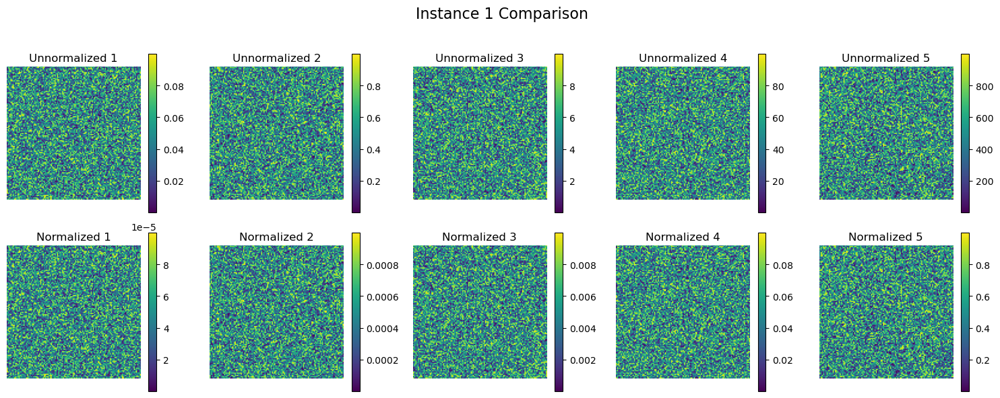

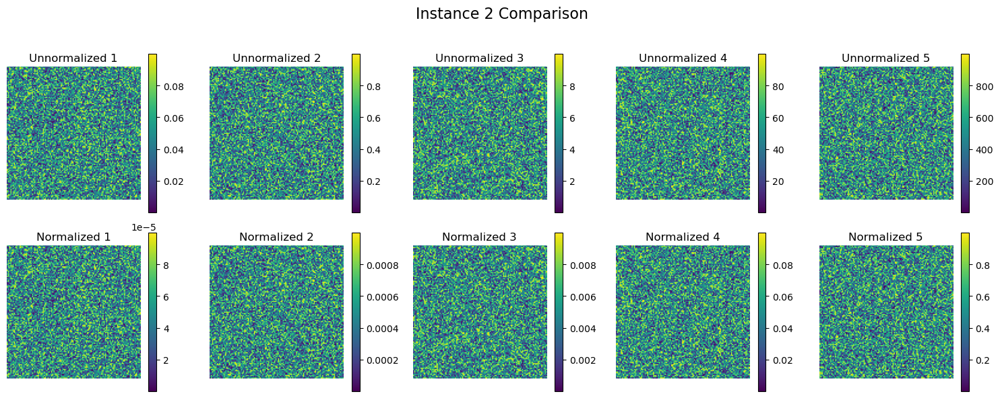

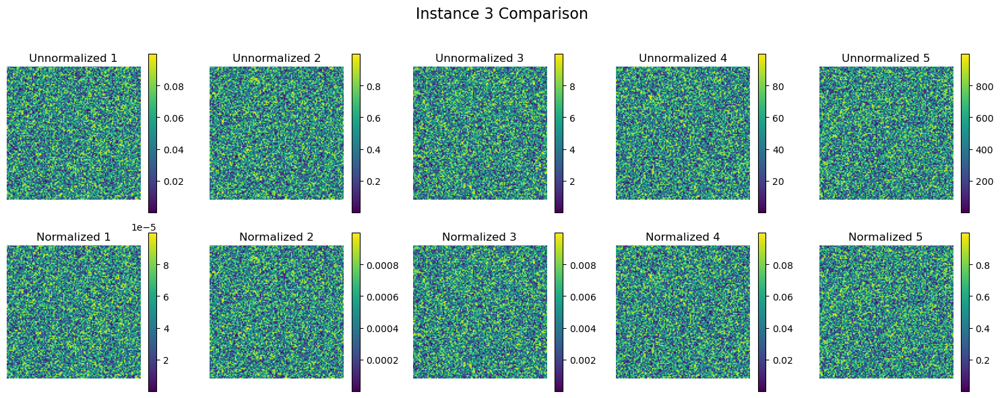

In [45]:
# Call the comparer:
if flag_plot: plot_comparison(use_X_vl, nrm_X_vl, instances=3)

In [37]:
# Normalize using the "filter" min and max:
def get_mins_and_maxs_of_filters(X):
    # Compute mins and maxs for each filter (across all images in the filter)
    mins = np.min(X, axis=(1, 2, 3), keepdims=True)  # Shape (5, 1, 1, 1)
    maxs = np.max(X, axis=(1, 2, 3), keepdims=True)  # Shape (5, 1, 1, 1)
    return mins, maxs

def norm_ins_by_filter(X, mins, maxs):
    # Normalize each filter using its corresponding min and max
    return (X - mins) / (maxs - mins)

# Usage:
mins_tr, maxs_tr = get_mins_and_maxs_of_filters(use_X_tr)

nrm_X_tr = norm_ins_by_filter(use_X_tr, mins_tr, maxs_tr)
nrm_X_vl = norm_ins_by_filter(use_X_vl, mins_tr, maxs_tr)
nrm_X_ts = norm_ins_by_filter(use_X_ts, mins_tr, maxs_tr)


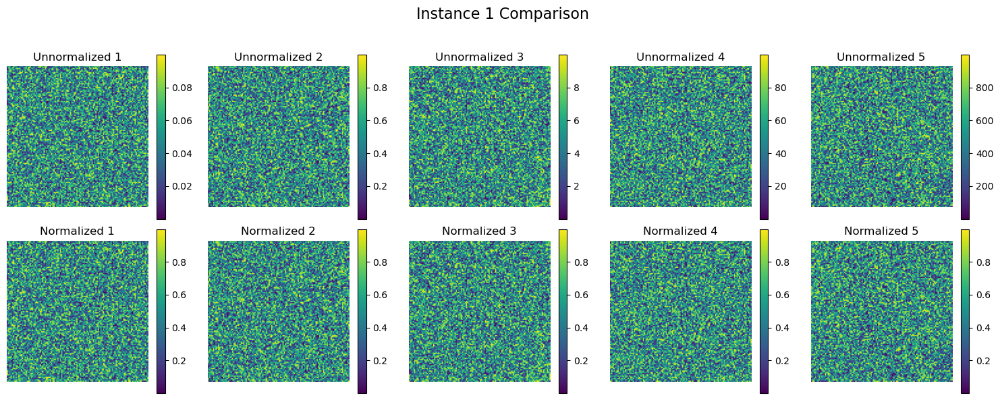

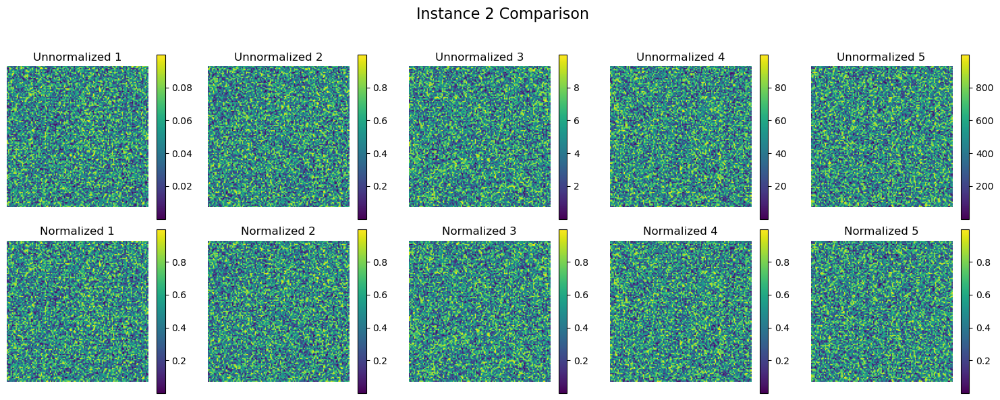

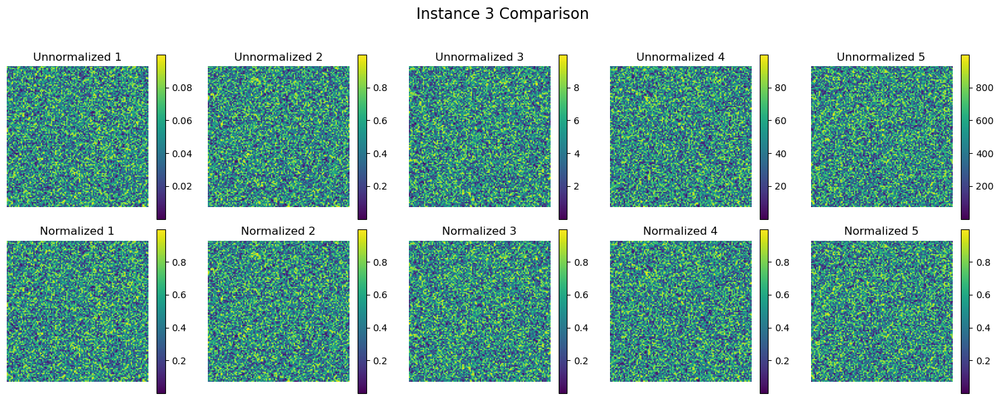

In [38]:
# Call the comparer:
if flag_plot: plot_comparison(use_X_vl, nrm_X_vl, instances=3)

In [39]:
# Normalize using the "five-images" min and max:
def get_mins_and_maxs_of_five_images(X):
    # Compute mins and maxs across all 5 filters for each instance (grouped across 5 filters)
    mins = np.min(X, axis=(0, 2, 3), keepdims=True)  # Shape (1, n, 1, 1)
    maxs = np.max(X, axis=(0, 2, 3), keepdims=True)  # Shape (1, n, 1, 1)
    return mins, maxs

def norm_ins_by_five_images(X, mins, maxs):
    # Normalize each group of 5 filters together
    return (X - mins) / (maxs - mins)

# Usage:
mins_tr, maxs_tr = get_mins_and_maxs_of_five_images(use_X_tr)
mins_vl, maxs_vl = get_mins_and_maxs_of_five_images(use_X_vl)
mins_ts, maxs_ts = get_mins_and_maxs_of_five_images(use_X_ts)

nrm_X_tr = norm_ins_by_five_images(use_X_tr, mins_tr, maxs_tr)
nrm_X_vl = norm_ins_by_five_images(use_X_vl, mins_vl, maxs_vl)
nrm_X_ts = norm_ins_by_five_images(use_X_ts, mins_ts, maxs_ts)


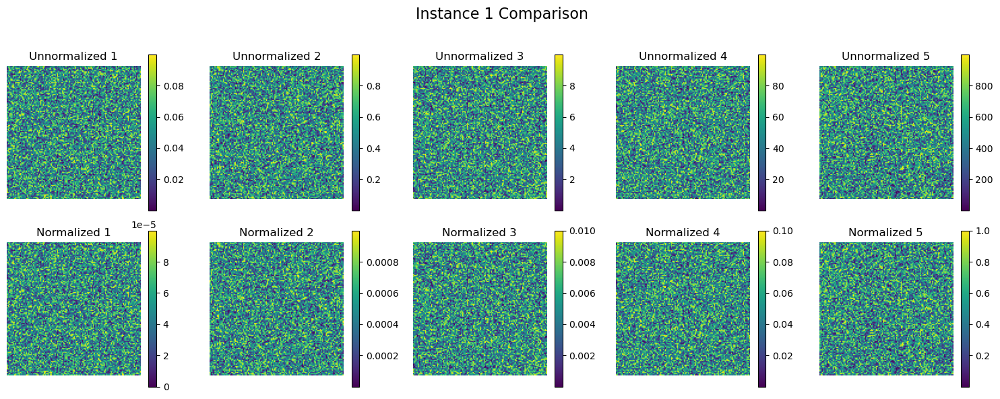

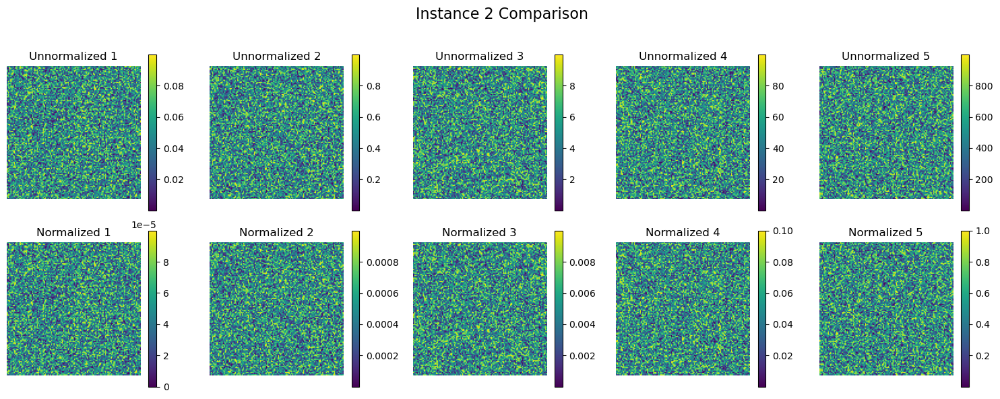

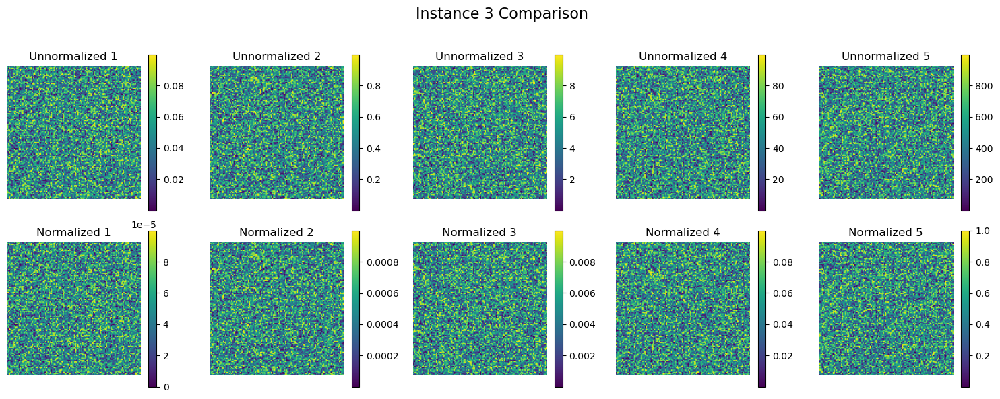

In [40]:
# Call the comparer:
if flag_plot: plot_comparison(use_X_vl, nrm_X_vl, instances=3)

In [41]:
# Normalize using the "single-image" min and max:
def get_mins_and_maxs_of_images(X):
    # Compute mins and maxs for each individual image
    mins = np.min(X, axis=(2, 3), keepdims=True)  # Shape (5, n, 1, 1)
    maxs = np.max(X, axis=(2, 3), keepdims=True)  # Shape (5, n, 1, 1)
    return mins, maxs

def norm_ins_by_single_image(X, mins, maxs):
    # Normalize each image individually
    return (X - mins) / (maxs - mins)

# Usage:
mins_tr, maxs_tr = get_mins_and_maxs_of_images(use_X_tr)
mins_vl, maxs_vl = get_mins_and_maxs_of_images(use_X_vl)
mins_ts, maxs_ts = get_mins_and_maxs_of_images(use_X_ts)

nrm_X_tr = norm_ins_by_single_image(use_X_tr, mins_tr, maxs_tr)
nrm_X_vl = norm_ins_by_single_image(use_X_vl, mins_vl, maxs_vl)
nrm_X_ts = norm_ins_by_single_image(use_X_ts, mins_ts, maxs_ts)


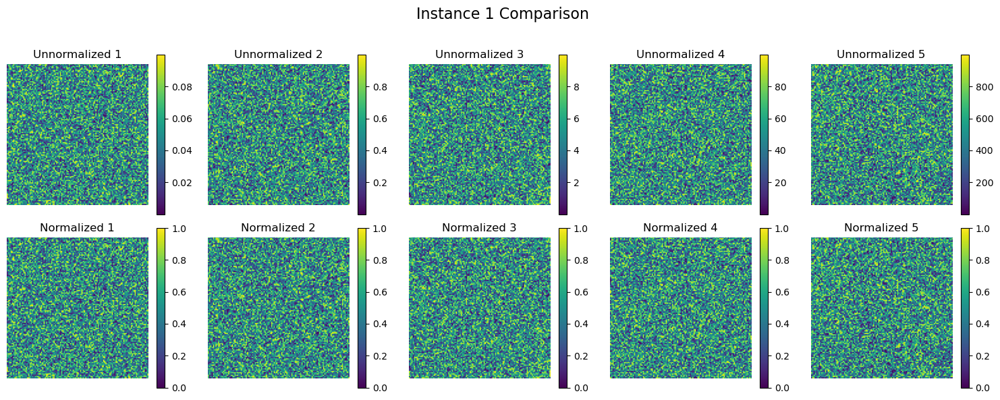

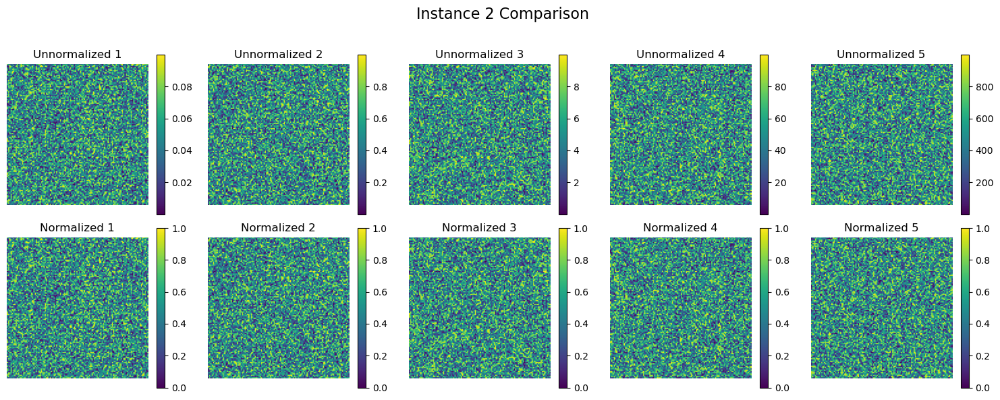

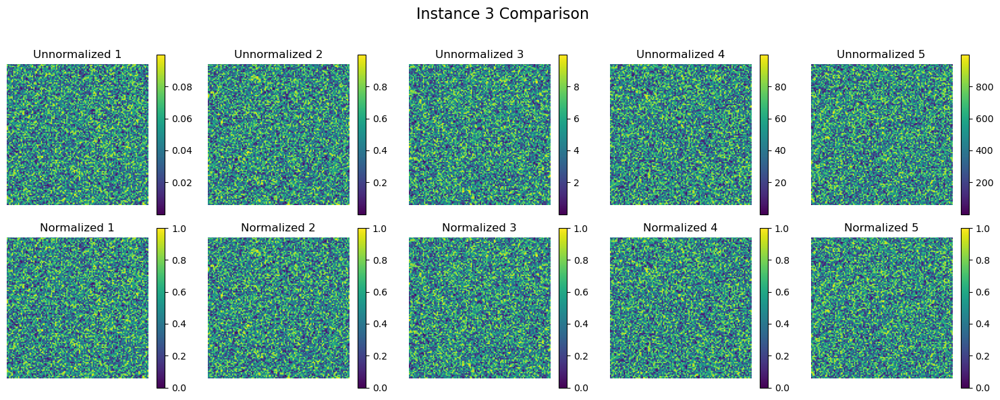

In [42]:
# Call the comparer:
if flag_plot: plot_comparison(use_X_vl, nrm_X_vl, instances=3)